# Executive Summary



## About Dataset

Transport for London Company want to explore new, environmentally-friendly forms of transport that can be used to reduce road congestion in London. Rental electric scooters (e-scooters) are the only way to legally ride an e-scooter on public roads or in other public places within London.

This dataset holds record for Trial period 13,14 and 15 which is recorded back in 2022. The values are
- Month
- Duration (min)
- Distance (kilometer)
- Average speed (kilometers per hour)
- Origin latitude
- Origin longitude
- Destination latitude
- Destination longitude

TFL Link: https://tfl.gov.uk/corporate/transparency/freedom-of-information/foi-request-detail?referenceId=FOI-1329-2223

About: https://tfl.gov.uk/modes/driving/electric-scooter-rental-trial

# Data Loading and Libraries Import

I will import the necessary libraries and upload the dataset in this section

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium

In [ ]:
# Downloading the data file directly from TFL source page

!wget https://foi.tfl.gov.uk/FOI-1329-2223/FOI-1329-2223%20%20Trip%20level%20data.csv

# !unzip -q '/content/london escooter trips.zip'

--2023-12-03 01:26:38--  https://foi.tfl.gov.uk/FOI-1329-2223/FOI-1329-2223%20%20Trip%20level%20data.csv
Resolving foi.tfl.gov.uk (foi.tfl.gov.uk)... 104.16.213.132, 104.16.212.132
Connecting to foi.tfl.gov.uk (foi.tfl.gov.uk)|104.16.213.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 27305831 (26M) [application/octet-stream]
Saving to: ‘FOI-1329-2223  Trip level data.csv’

FOI-1329-2223  Trip 100%[===================>]  26.04M  12.9MB/s    in 2.0s    

2023-12-03 01:26:41 (12.9 MB/s) - ‘FOI-1329-2223  Trip level data.csv’ saved [27305831/27305831]



In [ ]:
fp = '/content/FOI-1329-2223  Trip level data.csv'
df = pd.read_csv(fp)
df.head()

,Month,Duration (min),Distance (kilometer),Average speed (kilometers per hour),Origin latitude,Origin longitude,Destination latitude,Destination longitude
0,Sep-22,24,2.16,5.51,51.503,-0.118,51.505,-0.116
1,Sep-22,26,5.79,13.24,51.542,-0.139,51.533,-0.139
2,Sep-22,7,0.93,7.82,51.547,-0.173,51.543,-0.181
3,Sep-22,63,6.38,6.08,51.507,-0.125,51.508,-0.129
4,Sep-22,6,1.56,15.16,51.505,-0.226,51.493,-0.226


# EDA & Pre-Processing

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 562046 entries, 0 to 562045
Data columns (total 8 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   Month                                562046 non-null  object 
 1   Duration (min)                       562046 non-null  int64  
 2   Distance (kilometer)                 562046 non-null  float64
 3   Average speed (kilometers per hour)  562046 non-null  float64
 4   Origin latitude                      562046 non-null  float64
 5   Origin longitude                     562046 non-null  float64
 6   Destination latitude                 562046 non-null  float64
 7   Destination longitude                562046 non-null  float64
dtypes: float64(6), int64(1), object(1)
memory usage: 34.3+ MB


In [ ]:
df.shape

(562046, 8)

In [ ]:
# Down sampling

desired_percentage = 0.01  #

# Creating a list of downsampled DataFrames for each month
downsampled_dfs = [
    month_data.sample(frac=desired_percentage, random_state=42)
    for _, month_data in df.groupby('Month')
]

# Concatenate the list of downsampled DataFrames into one DataFrame
df = pd.concat(downsampled_dfs, ignore_index=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5620 entries, 0 to 5619
Data columns (total 8 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Month                                5620 non-null   object 
 1   Duration (min)                       5620 non-null   int64  
 2   Distance (kilometer)                 5620 non-null   float64
 3   Average speed (kilometers per hour)  5620 non-null   float64
 4   Origin latitude                      5620 non-null   float64
 5   Origin longitude                     5620 non-null   float64
 6   Destination latitude                 5620 non-null   float64
 7   Destination longitude                5620 non-null   float64
dtypes: float64(6), int64(1), object(1)
memory usage: 351.4+ KB


In [ ]:
df['Month'].unique()

array(['Aug-22', 'Jul-22', 'Jun-22', 'Sep-22'], dtype=object)

In [ ]:
df['Year'] = pd.to_datetime(df['Month'], format='%b-%y').dt.year
df['Month_Num'] = pd.to_datetime(df['Month'], format='%b-%y').dt.month

In [ ]:
columns_to_check = df.columns.difference(['Month', 'Year', 'Month_Num'])
duplicates = df[df.duplicated(subset=columns_to_check, keep=False)]

num_duplicates = len(duplicates)
print("Number of duplicate rows:", num_duplicates)

Number of duplicate rows: 0


In [ ]:
# Drop duplicates based on the specified columns
df = df.drop_duplicates(subset=columns_to_check, keep='first')

In [ ]:
# Preview the first few rows of the DataFrame to see the new columns
print(df[['Month', 'Year', 'Month_Num']].head())

    Month  Year  Month_Num
0  Aug-22  2022          8
1  Aug-22  2022          8
2  Aug-22  2022          8
3  Aug-22  2022          8
4  Aug-22  2022          8


In [ ]:
df['Year'].unique()

array([2022])

In [ ]:
df['Month_Num'].unique()

array([8, 7, 6, 9])

In [ ]:
print(df.shape)

(5620, 10)


In [ ]:
df.describe()

,Duration (min),Distance (kilometer),Average speed (kilometers per hour),Origin latitude,Origin longitude,Destination latitude,Destination longitude,Year,Month_Num
count,5620.000000,5620.000000,5620.000000,5620.000000,5620.000000,5620.000000,5620.000000,5620.0,5620.000000
mean,17.293772,2.702420,10.652151,51.514377,-0.152526,51.514361,-0.152461,2022.0,7.112989
std,15.178841,2.088875,4.120962,0.021318,0.058185,0.021520,0.058877,0.0,0.867771
min,1.000000,0.060000,0.170000,51.426000,-0.339000,51.411000,-0.339000,2022.0,6.000000
25%,7.000000,1.210000,7.650000,51.502000,-0.186000,51.502000,-0.186000,2022.0,6.000000
50%,13.000000,2.130000,11.235000,51.514000,-0.144000,51.514000,-0.144000,2022.0,7.000000
75%,22.000000,3.580000,13.902500,51.527000,-0.118000,51.526000,-0.118000,2022.0,8.000000
max,124.000000,14.880000,22.830000,51.585000,-0.002000,51.570000,-0.002000,2022.0,9.000000


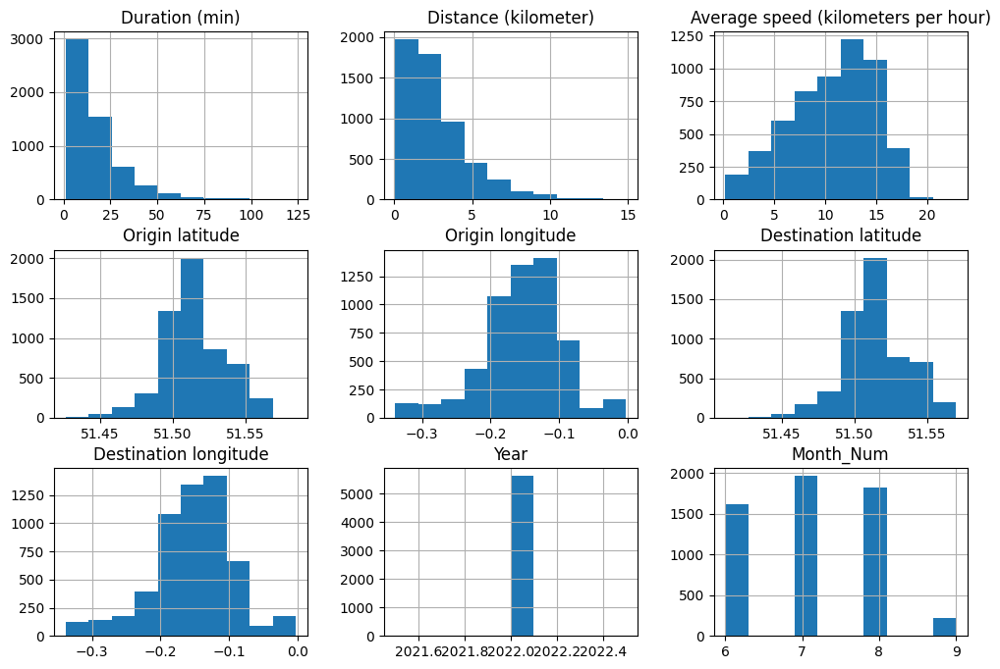

In [ ]:
# Histograms or box plots for numerical data
df.hist(figsize=(12, 8))
plt.show()

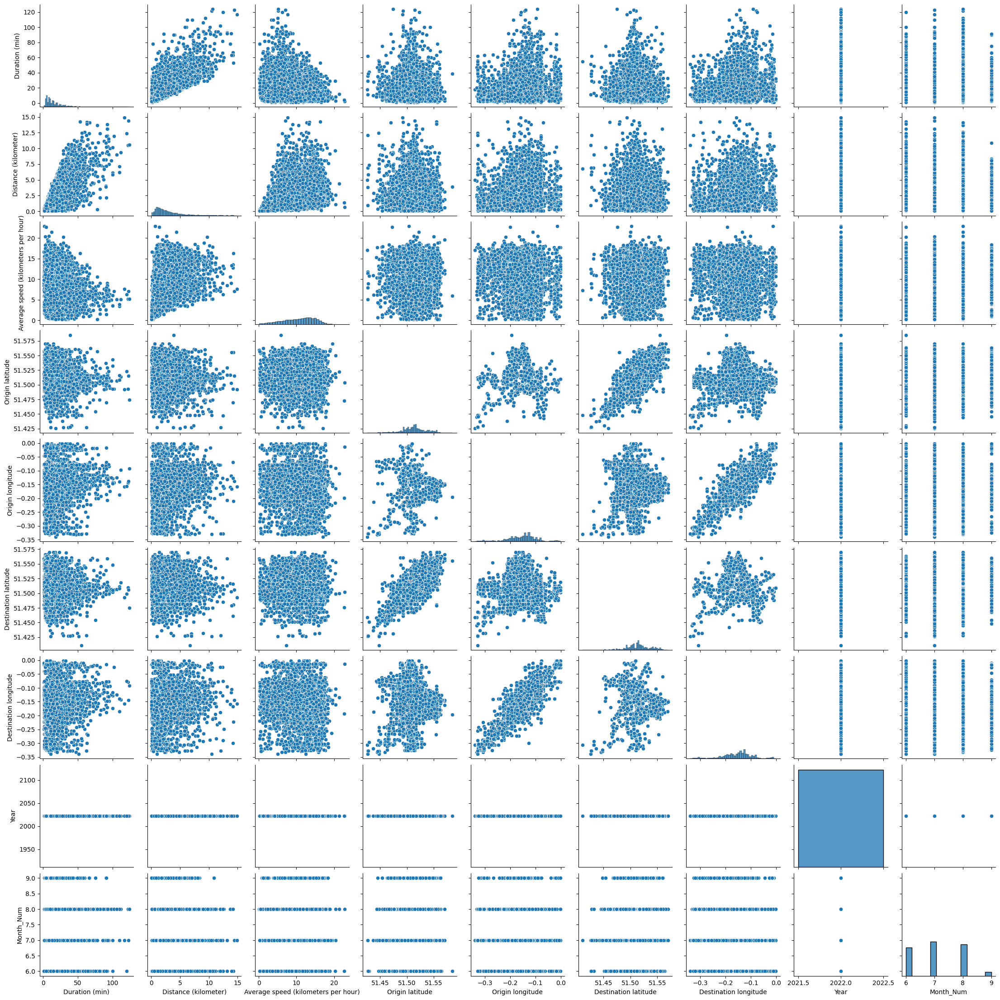

In [ ]:
# Pairplot for seeing pairwise relationships
sns.pairplot(df)
plt.show()

<ipython-input-18-2434a3203005>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df[0:8].corr(), annot=True)


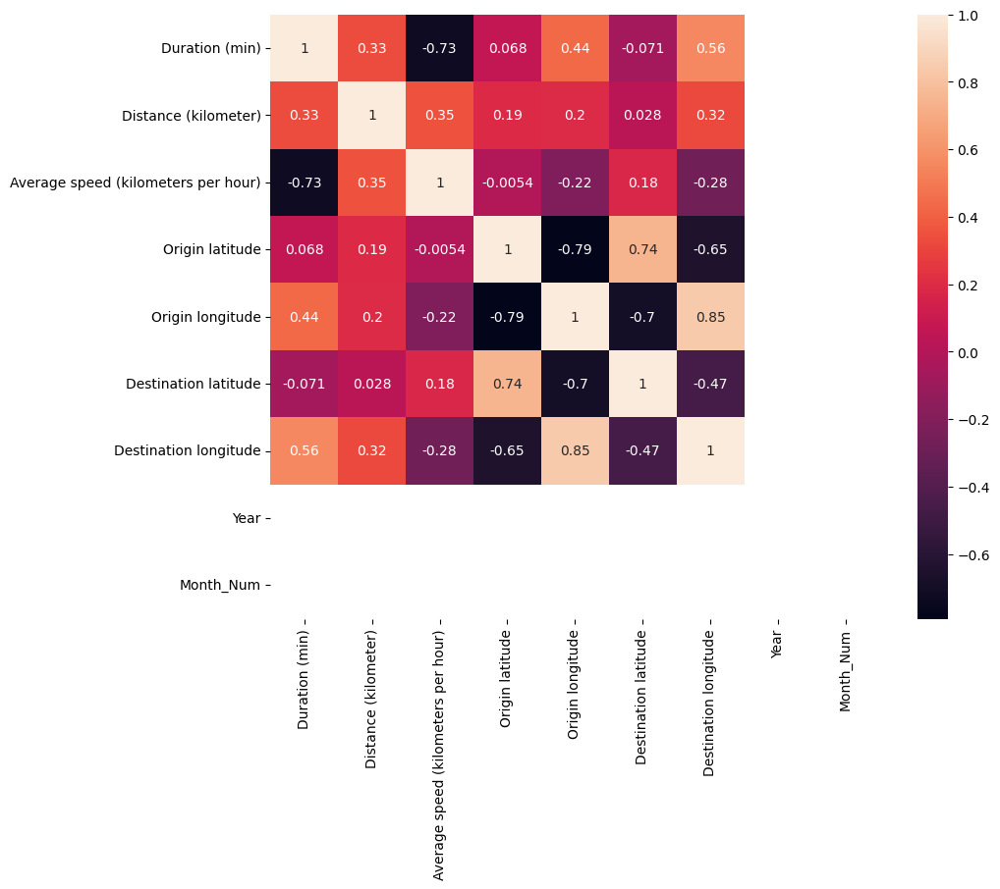

In [ ]:
# Correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(df[0:8].corr(), annot=True)
plt.show()

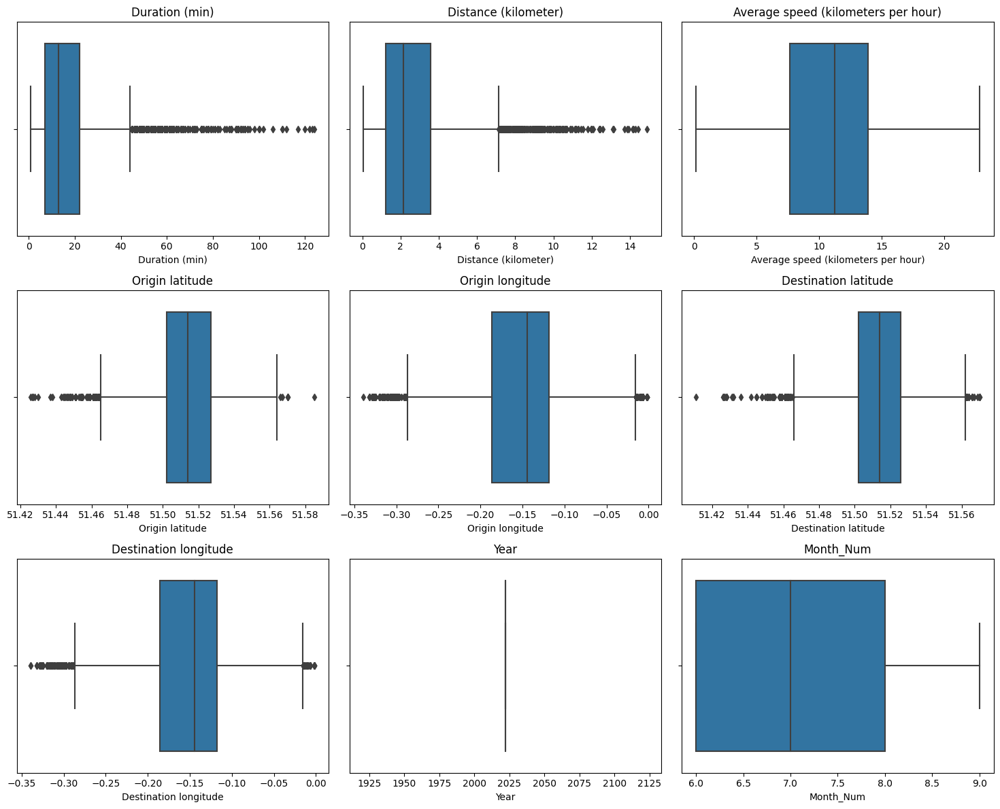

In [ ]:
# Selecting only the numeric columns for creating box plots

numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

n_cols = 3
n_rows = (len(numeric_columns) + n_cols - 1) // n_cols
# Creating a subplot grid
plt.figure(figsize=(15, n_rows * 4))
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.boxplot(x=df[column])
    plt.title(column)

plt.tight_layout()
plt.show()

In [ ]:
df.isnull().sum()

Month                                  0
Duration (min)                         0
Distance (kilometer)                   0
Average speed (kilometers per hour)    0
Origin latitude                        0
Origin longitude                       0
Destination latitude                   0
Destination longitude                  0
Year                                   0
Month_Num                              0
dtype: int64

In [ ]:
# Resetting index
df.reset_index(drop=True, inplace=True)

# Sample a subset of the DataFrame
sample_size = 500
sampled_df = df.sample(n=sample_size, random_state=42)

# Count frequency of each origin and destination
origin_counts = sampled_df.groupby(['Origin latitude', 'Origin longitude']).size().reset_index(name='Origin Count')
destination_counts = sampled_df.groupby(['Destination latitude', 'Destination longitude']).size().reset_index(name='Destination Count')

# Merge the counts back to the sampled DataFrame
sampled_df = sampled_df.merge(origin_counts, on=['Origin latitude', 'Origin longitude'])
sampled_df = sampled_df.merge(destination_counts, on=['Destination latitude', 'Destination longitude'])

# Central coordinates for the map of London
london_coordinates = [51.5074, -0.1278]

# Create a Folium map
map_london = folium.Map(location=london_coordinates, zoom_start=12)

# Iterate over the sampled data
for idx, row in sampled_df.iterrows():
    origin = [row['Origin latitude'], row['Origin longitude']]
    destination = [row['Destination latitude'], row['Destination longitude']]

    # Draw a line from origin to destination if they are different
    if origin != destination:
        folium.PolyLine(locations=[origin, destination], weight=2, color='blue').add_to(map_london)

    # Marker for origin
    folium.Marker(
        origin,
        popup=f'Origin Count: {row["Origin Count"]}',
        icon=folium.Icon(color='green', icon='info-sign')
    ).add_to(map_london)

    # Marker for destination (offset slightly if same as origin)
    offset_destination = destination if origin != destination else [destination[0] + 0.0001, destination[1] + 0.0001]
    folium.Marker(
        offset_destination,
        popup=f'Destination Count: {row["Destination Count"]}',
        icon=folium.Icon(color='red', icon='flag')
    ).add_to(map_london)

# Display the map
map_london

# Clustering

In [ ]:
df.head()

,Month,Duration (min),Distance (kilometer),Average speed (kilometers per hour),Origin latitude,Origin longitude,Destination latitude,Destination longitude,Year,Month_Num
0,Aug-22,9,2.58,17.87,51.506,-0.101,51.519,-0.079,2022,8
1,Aug-22,23,3.14,8.36,51.514,-0.097,51.512,-0.077,2022,8
2,Aug-22,37,3.40,5.49,51.512,-0.081,51.516,-0.060,2022,8
3,Aug-22,18,0.23,0.78,51.507,-0.111,51.507,-0.111,2022,8
4,Aug-22,7,2.01,17.21,51.488,-0.075,51.501,-0.092,2022,8


In [ ]:
# Scaling the values

from sklearn.preprocessing import StandardScaler

X1 = df.iloc[:, [1, 2]].values  # Selecting 2nd, 3rd, and 4th columns
X2 = df.iloc[:, [1, 3]].values # Selecting 1st and 3rd columns
X3 = df.iloc[:, [4, 5, 6, 7]].values  # Selecting 5th, 6th, 7th, and 8th columns

# Creating StandardScaler objects for each subset
sc_X1 = StandardScaler()
sc_X2 = StandardScaler()
sc_X3 = StandardScaler()

# Fit to the data and transform it
X1 = sc_X1.fit_transform(X1) # Duration and Distance
X2 = sc_X2.fit_transform(X2) # Duration and Speed
X3 = sc_X3.fit_transform(X3) # Longitude and Latitude of Origin and Destination

Based on the given data type, I am plotting 3 different types of clusters on different scales.
- X1: Duration (min) and Distance (kilometer)
- X2: Duration (min) and Average speed (kilometers per hour)
- X3: Origin Longitude/Latitude and Destination Longitude/Latitude

I am scaling the data in code above

## K Means

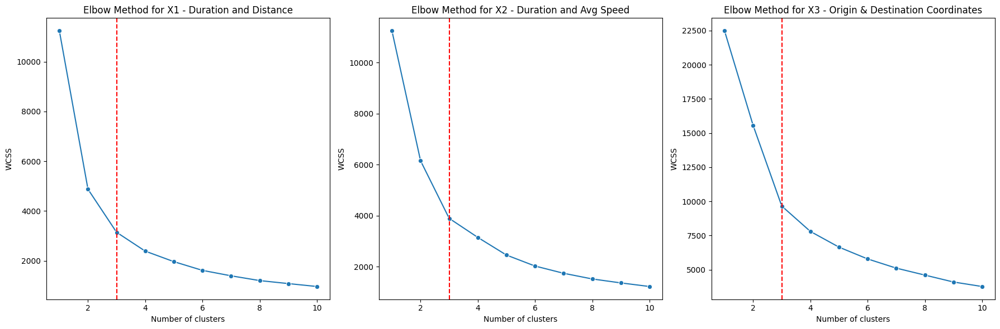

In [ ]:
!pip install kneed
from sklearn.cluster import KMeans
from kneed import KneeLocator

# Function to calculate WCSS and plot the elbow method
def plot_elbow_method(ax, data, title):
    wcss = []
    for i in range(1, 11):
        kmeans = KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42)
        kmeans.fit(data)
        wcss.append(kmeans.inertia_)

    # Finding the elbow point
    kneedle = KneeLocator(range(1, 11), wcss, S=1.0, curve='convex', direction='decreasing')

    # Plotting the elbow curve
    sns.lineplot(ax=ax, x=range(1, 11), y=wcss, marker="o")
    ax.set_title(title)
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('WCSS')

    # Marking the elbow point
    ax.axvline(x=kneedle.elbow, color='red', linestyle='--')

fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Plotting WCSS for each dataset
plot_elbow_method(axs[0], X1, 'Elbow Method for X1 - Duration and Distance')
plot_elbow_method(axs[1], X2, 'Elbow Method for X2 - Duration and Avg Speed')
plot_elbow_method(axs[2], X3, 'Elbow Method for X3 - Origin & Destination Coordinates')

# Display the plots
plt.tight_layout()
plt.show()

In [ ]:
# 'optimal_k' as determined with the determined number of clusters from the Elbow method

optimal_k = 3
kmeans = KMeans(n_clusters=optimal_k, init='k-means++', n_init=10, random_state=42)
y1_kmeans = cluster_labels = kmeans.fit_predict(X1)
y2_kmeans = cluster_labels = kmeans.fit_predict(X2)
y3_kmeans = cluster_labels = kmeans.fit_predict(X3)

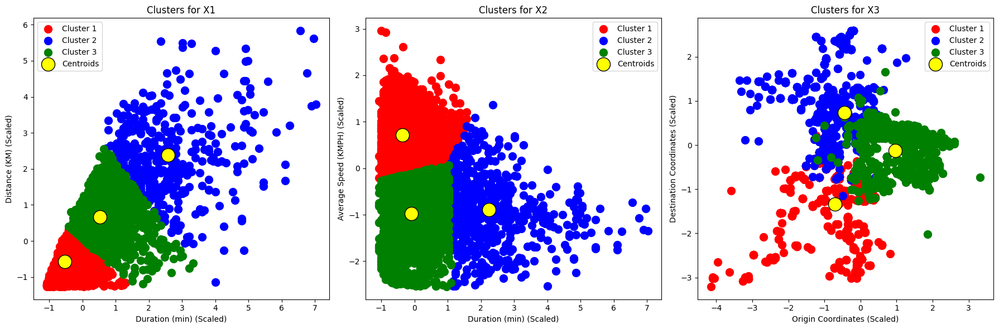

In [ ]:
def plot_clusters(ax, X, y_kmeans, kmeans, title, xlabel, ylabel):
    n_clusters = kmeans.n_clusters
    colors = ['red', 'blue', 'green', 'cyan', 'magenta', 'yellow', 'black', 'orange', 'purple', 'brown']

    for i in range(n_clusters):
        ax.scatter(X[y_kmeans == i, 0], X[y_kmeans == i, 1], s=100, c=colors[i], label=f'Cluster {i+1}')

    ax.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='yellow', label='Centroids', edgecolor='black')
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.legend()

# Fit KMeans and predict clusters for X1, X2, X3
kmeans_X1 = KMeans(n_clusters=optimal_k, init='k-means++', n_init=10, random_state=42).fit(X1)
y1_kmeans = kmeans_X1.predict(X1)

kmeans_X2 = KMeans(n_clusters=optimal_k, init='k-means++', n_init=10, random_state=42).fit(X2)
y2_kmeans = kmeans_X2.predict(X2)

kmeans_X3 = KMeans(n_clusters=optimal_k, init='k-means++', n_init=10, random_state=42).fit(X3)
y3_kmeans = kmeans_X3.predict(X3)

# Add cluster labels to the DataFrame
df['X1_cluster'] = y1_kmeans
df['X2_cluster'] = y2_kmeans
df['X3_cluster'] = y3_kmeans

# Creating subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Plot clusters for X1, X2, and X3
plot_clusters(axs[0], X1, y1_kmeans, kmeans_X1, 'Clusters for X1', 'Duration (min) (Scaled)', 'Distance (KM) (Scaled)')
plot_clusters(axs[1], X2, y2_kmeans, kmeans_X2, 'Clusters for X2', 'Duration (min) (Scaled)', 'Average Speed (KMPH) (Scaled)')
plot_clusters(axs[2], X3, y3_kmeans, kmeans_X3, 'Clusters for X3', 'Origin Coordinates (Scaled)', 'Destination Coordinates (Scaled)')

plt.tight_layout()
plt.show()

In [ ]:
# Plotting Origin Coordinates on Cluster to find out in what area most of the journeys are started

def plot_clusters_on_map(df, cluster_column, lat_col, lon_col, map_center, zoom_start=12):
    map_clusters = folium.Map(location=map_center, zoom_start=zoom_start)
    colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']

    for idx, row in df.iterrows():
        cluster = row['X3_cluster']
        folium.CircleMarker(
            location=[row[lat_col], row[lon_col]],
            radius=5,
            color=colors[cluster % len(colors)],
            fill=True,
            fill_color=colors[cluster % len(colors)],
            fill_opacity=0.7
        ).add_to(map_clusters)

    return map_clusters

london_coordinates = [51.5074, -0.1278]

map_clusters_X3 = plot_clusters_on_map(df, 'X3_cluster', 'Origin latitude', 'Origin longitude', london_coordinates)
map_clusters_X3

In [ ]:
# Plotting Destination Coordinates Cluster to find out in what area most of the journeys are started

def plot_clusters_on_map(df, cluster_column, lat_col, lon_col, map_center, zoom_start=12):
    map_clusters = folium.Map(location=map_center, zoom_start=zoom_start)
    colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']

    for idx, row in df.iterrows():
        cluster = row['X3_cluster']
        folium.CircleMarker(
            location=[row[lat_col], row[lon_col]],
            radius=5,
            color=colors[cluster % len(colors)],
            fill=True,
            fill_color=colors[cluster % len(colors)],
            fill_opacity=0.7
        ).add_to(map_clusters)

    return map_clusters


london_coordinates = [51.5074, -0.1278]

map_clusters_X3 = plot_clusters_on_map(df, 'X3_cluster', 'Destination latitude', 'Destination longitude', london_coordinates)
map_clusters_X3

In [ ]:
# Evaluating the clusters

from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

def evaluate_clusters(X, y):
    silhouette_avg = silhouette_score(X, y)
    calinski_harabasz = calinski_harabasz_score(X, y)
    davies_bouldin = davies_bouldin_score(X, y)

    print(f"Silhouette Score: {silhouette_avg}")
    print(f"Calinski-Harabasz Index: {calinski_harabasz}")
    print(f"Davies-Bouldin Index: {davies_bouldin}")

print("**** KMeans Evaluation ****")

# Evaluate clusters for X1, X2, and X3
print("Evaluation for X1 Clusters:")
evaluate_clusters(X1, y1_kmeans)

print("\nEvaluation for X2 Clusters:")
evaluate_clusters(X2, y2_kmeans)

print("\nEvaluation for X3 Clusters:")
evaluate_clusters(X3, y3_kmeans)

**** KMeans Evaluation ****
Evaluation for X1 Clusters:
Silhouette Score: 0.5222955501289638
Calinski-Harabasz Index: 7232.059639382779
Davies-Bouldin Index: 0.7903785836218703

Evaluation for X2 Clusters:
Silhouette Score: 0.4512630788654639
Calinski-Harabasz Index: 5294.8852145671535
Davies-Bouldin Index: 0.8142010599738722

Evaluation for X3 Clusters:
Silhouette Score: 0.35712354727034923
Calinski-Harabasz Index: 3731.5152309207183
Davies-Bouldin Index: 0.919051837476695


## Agglomerative Clustering

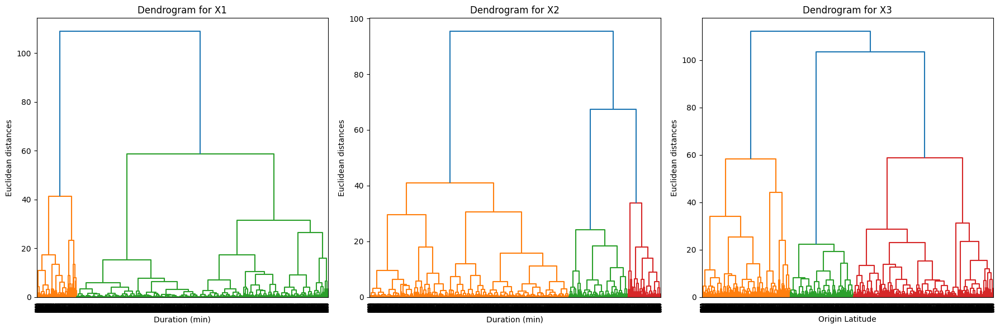

In [ ]:
import scipy.cluster.hierarchy as sch

def plot_dendrogram(ax, X, title, xlabel, ylabel):
    dendrogram = sch.dendrogram(sch.linkage(X, method='ward'), ax=ax)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)

# Creating subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Plotting dendrogram for each dataset
plot_dendrogram(axs[0], X1, 'Dendrogram for X1', 'Duration (min)', 'Euclidean distances')
plot_dendrogram(axs[1], X2, 'Dendrogram for X2', 'Duration (min)', 'Euclidean distances')
plot_dendrogram(axs[2], X3, 'Dendrogram for X3', 'Origin Latitude', 'Euclidean distances')

# Display the subplots
plt.tight_layout()
plt.show()

In [ ]:
# Fitting Hierarchical Clustering to the dataset
from sklearn.cluster import AgglomerativeClustering

hc = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
y1_hc = hc.fit_predict(X1)
y2_hc = hc.fit_predict(X2)
y3_hc = hc.fit_predict(X3)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


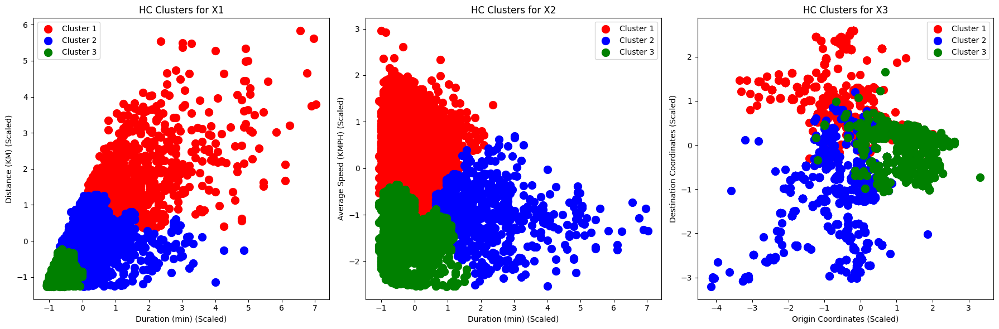

In [ ]:
def plot_hc_clusters(ax, X, y_hc, title, xlabel, ylabel):
    n_clusters = max(y_hc) + 1
    colors = ['red', 'blue', 'green', 'cyan', 'magenta', 'yellow', 'black', 'orange', 'purple', 'brown']

    for i in range(n_clusters):
        ax.scatter(X[y_hc == i, 0], X[y_hc == i, 1], s=100, c=colors[i], label=f'Cluster {i+1}')

    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.legend()

# Creating subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Plot clusters for X1, X2, and X3 with hierarchical clustering
plot_hc_clusters(axs[0], X1, y1_hc, 'HC Clusters for X1', 'Duration (min) (Scaled)', 'Distance (KM) (Scaled)')
plot_hc_clusters(axs[1], X2, y2_hc, 'HC Clusters for X2', 'Duration (min) (Scaled)', 'Average Speed (KMPH) (Scaled)')
plot_hc_clusters(axs[2], X3, y3_hc, 'HC Clusters for X3', 'Origin Coordinates (Scaled)', 'Destination Coordinates (Scaled)')

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

def evaluate_clusters(X, y_hc):
    silhouette_avg = silhouette_score(X, y_hc)
    calinski_harabasz = calinski_harabasz_score(X, y_hc)
    davies_bouldin = davies_bouldin_score(X, y_hc)

    print(f"Silhouette Score: {silhouette_avg}")
    print(f"Calinski-Harabasz Index: {calinski_harabasz}")
    print(f"Davies-Bouldin Index: {davies_bouldin}")

print("**** Agglomerative Evaluation ****")


# Evaluate clusters for X1, X2, and X3
print("\nEvaluation for X1 Clusters:")
evaluate_clusters(X1, y1_hc)

print("\nEvaluation for X2 Clusters:")
evaluate_clusters(X2, y2_hc)

print("\nEvaluation for X3 Clusters:")
evaluate_clusters(X3, y3_hc)

**** Agglomerative Evaluation ****
Evaluation for X1 Clusters:
Silhouette Score: 0.4244239622913787
Calinski-Harabasz Index: 6021.920959741543
Davies-Bouldin Index: 0.7994945961027327

Evaluation for X2 Clusters:
Silhouette Score: 0.43195534942661973
Calinski-Harabasz Index: 4330.253636138967
Davies-Bouldin Index: 0.7859898695745139

Evaluation for X3 Clusters:
Silhouette Score: 0.32606187459570657
Calinski-Harabasz Index: 3022.451368946941
Davies-Bouldin Index: 1.0202233933113358


## DBSCAN

In [ ]:
from sklearn.cluster import DBSCAN

# Apply DBSCAN to X1
dbscan_X1 = DBSCAN(eps=0.5, min_samples=5).fit(X1)  # Adjust eps and min_samples as needed
y1_dbscan = dbscan_X1.labels_

# Apply DBSCAN to X2
dbscan_X2 = DBSCAN(eps=0.5, min_samples=5).fit(X2)  # Adjust eps and min_samples as needed
y2_dbscan = dbscan_X2.labels_

# Apply DBSCAN to X3
dbscan_X3 = DBSCAN(eps=0.5, min_samples=5).fit(X3)  # Adjust eps and min_samples as needed
y3_dbscan = dbscan_X3.labels_

<ipython-input-47-ceabdf74f532>:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('Spectral', len(labels))


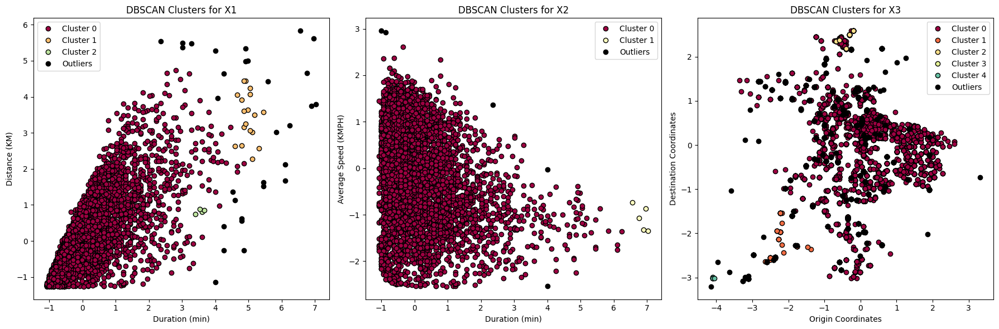

In [ ]:
def plot_dbscan_clusters(ax, X, y_dbscan, title, xlabel, ylabel):
    # Set of unique labels
    labels = set(y_dbscan)

    # Generate a color map
    color_map = plt.cm.get_cmap('Spectral', len(labels))

    for k in labels:
        if k == -1:
            # Use black for noise (outliers)
            col = 'k'
        else:
            col = color_map(k)

        class_member_mask = (y_dbscan == k)

        ax.plot(X[class_member_mask, 0], X[class_member_mask, 1], 'o', markerfacecolor=col, markeredgecolor='k', markersize=6, label=f'Cluster {k}' if k != -1 else 'Outliers')

    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.legend()

# Creating subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Plot DBSCAN clusters for X1, X2, and X3
plot_dbscan_clusters(axs[0], X1, y1_dbscan, 'DBSCAN Clusters for X1', 'Duration (min)', 'Distance (KM)')
plot_dbscan_clusters(axs[1], X2, y2_dbscan, 'DBSCAN Clusters for X2', 'Duration (min)', 'Average Speed (KMPH)')
plot_dbscan_clusters(axs[2], X3, y3_dbscan, 'DBSCAN Clusters for X3', 'Origin Coordinates', 'Destination Coordinates')

plt.tight_layout()
plt.show()


DBSCAN cluster is not giving satisfactory results for this type of data